<a href="https://colab.research.google.com/github/itacdonev/fastai-course/blob/main/lecture_1/lecture_1_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

Follwoing lecture 1 we will build a computer vision model for classifying different flower types. Our categories for flower types are: 
- daisy
- tulips
- roses

Our **objective** of this notebook is to succesfully train a computer vision classification model with a low error rate.

The steps are as follows:
1. **Gather the data**: Download the data using the fastai functions to directly download images using Duck Duck Go
2. **Verify the images** and if any are not OK, unlink them from the data
3. **Fit a pretrained model** on our data for 1 epoch - just to test if everything is working
4. Train a model for 5 epochs and analyze the difference - was the extra computation power worth it?
5. Infer the model on new images which we manually downloaded from google.


# Prepare the working environment

To ensure that we have the latest fastai installed we need to run the following piece of code:

In [1]:
!pip install -Uqq fastai

In [2]:
!pip install fastbook

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 719 kB 5.0 MB/s 
     |████████████████████████████████| 5.8 MB 67.3 MB/s 
     |████████████████████████████████| 451 kB 78.9 MB/s 
     |████████████████████████████████| 1.3 MB 65.4 MB/s 
     |████████████████████████████████| 1.6 MB 65.3 MB/s 
     |████████████████████████████████| 182 kB 78.6 MB/s 
     |████████████████████████████████| 132 kB 71.2 MB/s 
     |████████████████████████████████| 212 kB 76.5 MB/s 
     |████████████████████████████████| 127 kB 75.2 MB/s 
     |████████████████████████████████| 7.6 MB 49.6 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


Now that we have all the libraries installed, we can import the complete `vision` library. The `fastai.vision.all` is a module that is specifically designed to cover computer vision problems.

In [3]:
from fastai.vision.all import *
from fastbook import *
from pathlib import Path
from itertools import tee

# Gathering Data

## Download the Images

As we saw in chapter 1 and 2 gathering data is very crucial step in any machine learning model. For this project we will use the function `search_images_ddg()` which uses Duck Duck Go engine to search and download images given a specific keyword. First, let's try the function with the keyword `daisy` and see what we get:

In [4]:
# Search for one image with a keyword 'daisy'
urls = search_images_ddg('daisy', max_images=1)

# Print the url of the image
len(urls),urls[0]

(1, 'https://jooinn.com/images/little-daisy-flowers-5.jpg')

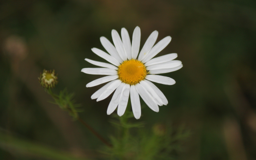

In [5]:
# Define a path object for the image
dest = Path('daisy')

# Download the image
if not dest.exists():
    download_url(urls[0],
                 dest,
                 show_progress=False)

# Open the image from 'dest' folder and save as im
im = Image.open(dest)

# Show image
im.to_thumb(256,256)

We saw that the process generally works, so now we can add all of our desired keywords and save each in a separate folder under the main folder `images`. We should end up with the main directory `images` and sub-directories `daisy`, `tulips`, and `roses`. Each sub-directory should contain max 200 images. Note that this search for images is not full proof meaning that there will, most probably, be images which are not flowers, but we will deal with this issue later on.

In [6]:
# Define the keywords for search - what we want to classify
searches = 'daisy', 'tulips', 'roses'

# Define a path object where each of the keyword images will be saved
path = Path('images')

# How many images to download
N_IMAGES = 200

# Download the images and save in defined keyword folder
# - The folders will be created if they don't exist
if not path.exists():
    for o in searches:
        # Create a path object given a keyword
        dest = (path/o)
        print(f'Gathering data for {dest}')

        # Create directory if one does not exist
        dest.mkdir(parents=True, exist_ok=True)

        # Search and download images
        results = search_images_ddg(f"{o} photo")
        download_images(dest, urls=results[:N_IMAGES])

        # Resize images
        resize_images(dest, max_size=400, dest=dest)

Gathering data for images/daisy
Gathering data for images/tulips
Gathering data for images/roses


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Let's check how many images we have downloded and save the list of unique file extensions for the downloaded images. We will use the file extensions later on to tell the fastai library which file extensions should be included in our dataset. This is generally not necessary as the default setting is enough to get the example running, but analyzing some examples it can be the case that the files with `.jpg!d` are not recognized when creating a databuilder. 

In [7]:
def image_stats(searches):
    # Initialize a list to save file extensions and count of images
    exts_list = []
    n_imgs = []

    # For each keyword
    for i in searches:
        # Define a subfolder path object
        fd = path/i

        # Find all the images paths in the directory
        images1, images2 = tee(fd.glob('*.*'))

        # Print number of images for each keyword
        cnt_imgs = len(list(images1))
        print(f'{i} = {cnt_imgs}')
        n_imgs.append(cnt_imgs)

        # Extract file extention from the image path object
        # Loop through the images generator
        for img in images2:
            
            # Get the suffix of the path object
            img_ext = Path(img).suffix

            # Add to the list if not already in the list
            if img_ext not in exts_list:
                exts_list.append(img_ext)

    print('-'*35)
    print(f'File extensions: {exts_list}')

    return n_imgs, exts_list

In [8]:
_, exts_list = image_stats(searches)

daisy = 192
tulips = 193
roses = 194
-----------------------------------
File extensions: ['.jpg', '.php', '.jpeg', '.png', '.JPG', '.Jpg', '.jpg!d']


## Verify the Images

Since we have downloaded the images from the internet automatically by using a keyword we can expect that some images might be corrupt. Using `verify_images()` we perform the automatic check. In case there are some failed images we unlink them from the path object.

In [9]:
# Check for failed images
failed_imgs = verify_images(get_image_files(path))

# Unlink the failed images
if len(failed_imgs) != 0:
    print(f'Number of failed images: {len(failed_imgs)}')
    print('Unlinking failed images ...')
    failed_imgs.map(Path.unlink)

Number of failed images: 4
Unlinking failed images ...


As we have seen above, some images were not OK, and have been unlinked from the dataset. Let's do the count again to see where we lost the images.

In [10]:
n_imgs, exts_list = image_stats(searches)

daisy = 192
tulips = 190
roses = 193
-----------------------------------
File extensions: ['.jpg', '.php', '.jpeg', '.png', '.JPG', '.Jpg', '.jpg!d']


Now we can check that the number of images are all the same as in the fastai dataloader. We use function `get_files` with argument `extensions` to be set to our list of image extensions. 

In [11]:
assert sum(n_imgs) == len(get_files(path, extensions=exts_list))

## Create a `DataBlock()`

In [12]:
??DataBlock

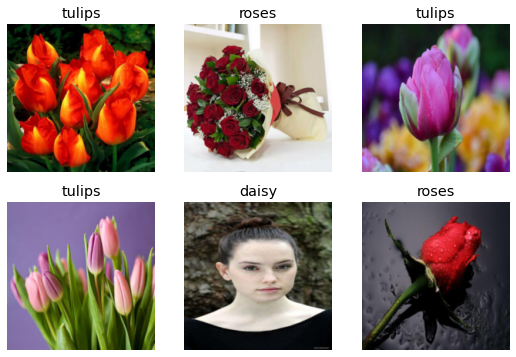

In [13]:
# Create a datablock for input data
dls = DataBlock(
    blocks=(ImageBlock, 
            CategoryBlock),             # Single label categorical targets
    get_items=get_image_files,           # List of paths of all image files
    splitter=RandomSplitter(            # Split the input data into training and validation
        valid_pct=0.2,                  # Validation set
        seed=42),                       # Ensures the same split on each iteration
    get_y=parent_label,                 # Label item with the parent folder name
    item_tfms=[Resize(192,              # Item transformations
               method='squish')
    ]
).dataloaders(path)

# Show 6 images
dls.show_batch(max_n=6)

We can see that some images are definitely not flowers, and we will need to take further actions to clean the data. But first let's build a model on this dataset to see that the pipeline works.

# Train the Model

We fit a model using a pretrained ResNet18 model. Using a pretrained model saves time and computational cost. The model is trained for 3 epochs, i.e. the models sees each image 3 times.

In [14]:
learn = vision_learner(dls,                 # input data 
                       resnet18,            # pretrained model
                       metrics=error_rate)  # metric

learn.fine_tune(3)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.503055,0.331613,0.105263,00:09


epoch,train_loss,valid_loss,error_rate,time
0,0.332374,0.249311,0.087719,00:03
1,0.235118,0.274288,0.078947,00:03
2,0.158782,0.283442,0.078947,00:03


Since this is a classification problem (we are trying to classify images of different flower types) we can draw the confusion matrix to see in which class the model makes mistakes and vice versa:

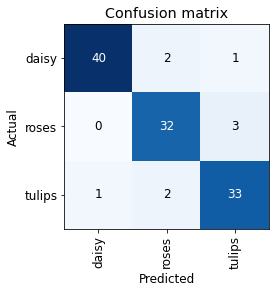

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Plot top losses, i.e. images which have high loss. We can see that there can be cases that the predicted and actual class is the same, which would count as a correct prediction, but it can still have higher loss and lower probability making the model unsure whether it is really the class it is predicting.

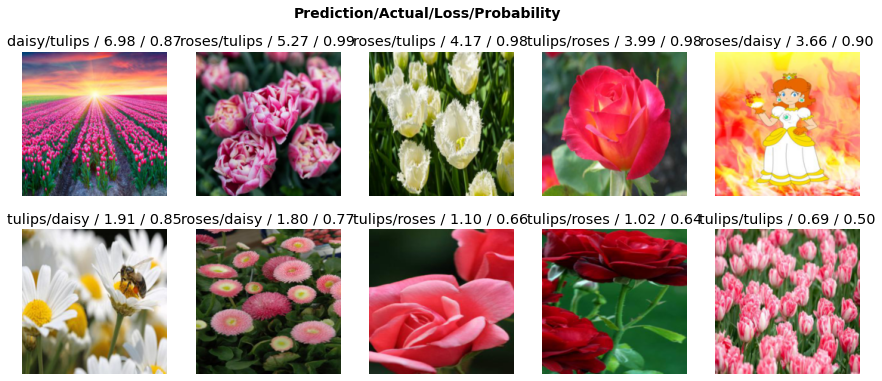

In [16]:
interp.plot_top_losses(10, nrows=2)

Using `show_results(2)` will provide the predicted and actual class for an image with the index 2.

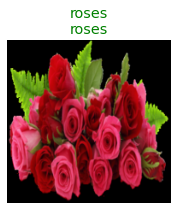

In [17]:
interp.show_results(2)

As we saw from the above `show_batch()` there were some images that are not really flowers. We can use `ImageClassifierCleaner()` to manually check the images in the validation and training datasets for each class label.

As we change the image label manually the information is stored in the object `cleaner` which we use later on to apply on our dataset.

In [18]:
from fastai.vision.widgets import *
cleaner = ImageClassifierCleaner(learn)
cleaner

We can now use our manual changes and apply it to our dataset:

In [19]:
# if we changed class labels for images
for idx, cat in cleaner.change():
    shutil.move(str(cleaner.fns[idx]), path/cat)

In [20]:
# if we marked to delete a specific image
for idx in cleaner.delete():
    cleaner.fns[idx].unlink()

Run the model **after** the data has been cleaned.

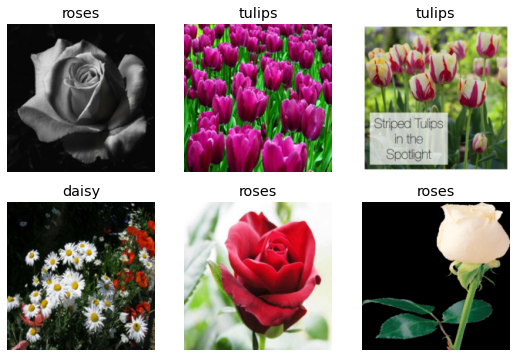

In [22]:
dls1 = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path)

dls1.show_batch(max_n=6)

In [23]:
learn1 = vision_learner(dls1, resnet18, metrics=error_rate)
learn1.fine_tune(3)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.440914,0.339069,0.096491,00:03


epoch,train_loss,valid_loss,error_rate,time
0,0.392528,0.200531,0.070175,00:03
1,0.254761,0.212874,0.070175,00:03
2,0.181216,0.221465,0.070175,00:04


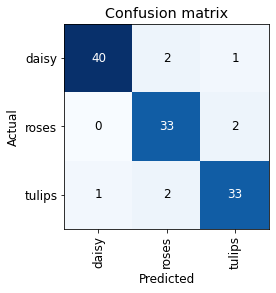

In [24]:
interp1 = ClassificationInterpretation.from_learner(learn1)
interp1.plot_confusion_matrix()

Train the model for 10 epochs:

In [25]:
learn10 = vision_learner(dls1, resnet18, metrics=error_rate)
learn10.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.605227,0.423285,0.149123,00:03


epoch,train_loss,valid_loss,error_rate,time
0,0.404082,0.250988,0.078947,00:03
1,0.298800,0.204007,0.061404,00:03
2,0.204309,0.178328,0.043860,00:04
3,0.150022,0.185792,0.043860,00:04
4,0.114983,0.205426,0.052632,00:04
5,0.089733,0.206499,0.061404,00:05
6,0.073426,0.202845,0.052632,00:05
7,0.061293,0.202249,0.052632,00:04
8,0.051244,0.202254,0.043860,00:03
9,0.043013,0.203887,0.043860,00:03


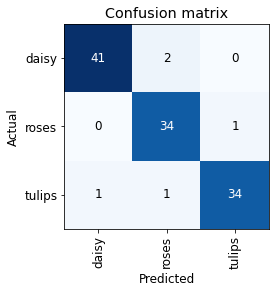

In [26]:
interp10 = ClassificationInterpretation.from_learner(learn10)
interp10.plot_confusion_matrix()

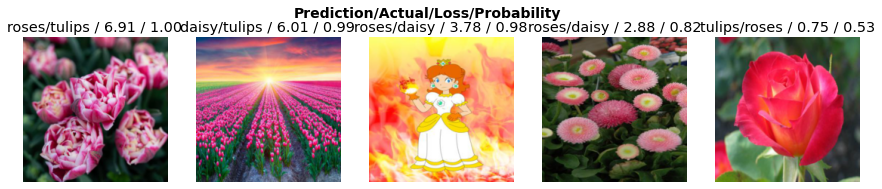

In [27]:
interp10.plot_top_losses(5, nrows=1)

In [28]:
learn10.export(fname='ch1_flowers_model.pkl')